In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score
%matplotlib inline
import numpy

In [2]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

In [3]:
dataset=pd.read_csv("training_set_features.csv")
temp=pd.read_csv("training_set_features.csv")

In [4]:
dataset.head(10)

,respondent_id,xyz_concern,xyz_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_xyz,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_xyz_vacc_effective,opinion_xyz_risk,opinion_xyz_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
5,5,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,NaN,5.0,2.0,1.0,5.0,4.0,4.0,65+ Years,12 Years,White,Male,"<= $75,000, Above Poverty",Married,Own,Employed,atmpeygn,"MSA, Principle City",2.0,3.0,saaquncn,vlluhbov
6,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,1.0,1.0,4.0,2.0,1.0,55 - 64 Years,< 12 Years,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",0.0,0.0,xicduogh,xtkaffoo
7,7,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,5.0,2.0,1.0,4.0,2.0,1.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,bhuqouqj,Non-MSA,2.0,0.0,pxcmvdjn,xqwwgdyp
8,8,0.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,1.0,1.0,4.0,2.0,1.0,45 - 54 Years,College Graduate,White,Male,"> $75,000",Married,Own,Employed,bhuqouqj,"MSA, Not Principle City",1.0,0.0,xicduogh,ccgxvspp
9,9,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,55 - 64 Years,12 Years,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,"MSA, Not Principle City",0.0,0.0,NaN,NaN


In [5]:
dataset=dataset.loc[:,["respondent_id","behavioral_antiviral_meds","doctor_recc_seasonal","opinion_seas_vacc_effective","opinion_seas_risk","opinion_seas_sick_from_vacc"]]

In [6]:
dataset.shape

(26707, 6)

In [7]:
dataset.head(10)

,respondent_id,behavioral_antiviral_meds,doctor_recc_seasonal,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc
0,0,0.0,0.0,2.0,1.0,2.0
1,1,0.0,0.0,4.0,2.0,4.0
2,2,0.0,NaN,4.0,1.0,2.0
3,3,0.0,1.0,5.0,4.0,1.0
4,4,0.0,0.0,3.0,1.0,4.0
5,5,0.0,1.0,5.0,4.0,4.0
6,6,0.0,0.0,4.0,2.0,1.0
7,7,0.0,0.0,4.0,2.0,1.0
8,8,0.0,0.0,4.0,2.0,1.0
9,9,0.0,0.0,4.0,2.0,2.0


In [8]:
dataset["Target"]=pd.read_csv("training_set_labels.csv")["seasonal_vaccine"]

In [9]:
dataset.head(50)

,respondent_id,behavioral_antiviral_meds,doctor_recc_seasonal,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,Target
0,0,0.0,0.0,2.0,1.0,2.0,0
1,1,0.0,0.0,4.0,2.0,4.0,1
2,2,0.0,NaN,4.0,1.0,2.0,0
3,3,0.0,1.0,5.0,4.0,1.0,1
4,4,0.0,0.0,3.0,1.0,4.0,0
5,5,0.0,1.0,5.0,4.0,4.0,0
6,6,0.0,0.0,4.0,2.0,1.0,0
7,7,0.0,0.0,4.0,2.0,1.0,1
8,8,0.0,0.0,4.0,2.0,1.0,0
9,9,0.0,0.0,4.0,2.0,2.0,0


In [10]:
dataset.isnull().sum()

respondent_id                     0
behavioral_antiviral_meds        71
doctor_recc_seasonal           2160
opinion_seas_vacc_effective     462
opinion_seas_risk               514
opinion_seas_sick_from_vacc     537
Target                            0
dtype: int64

<Axes: >

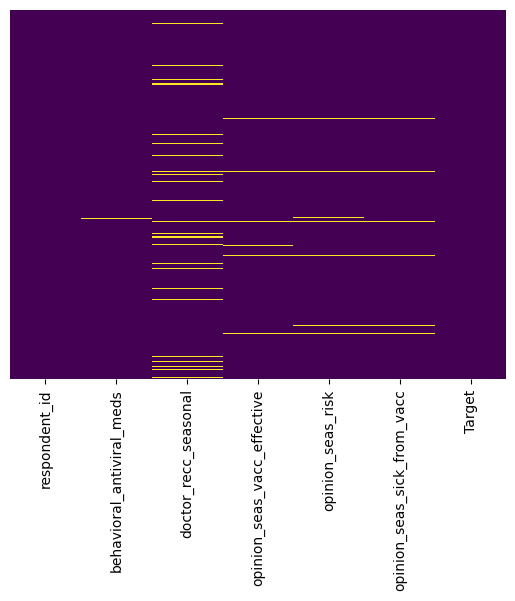

In [11]:
sns.heatmap(dataset.isnull(),cmap='viridis', cbar=False, yticklabels=False)

In [12]:
dataset.behavioral_antiviral_meds.mode()[0]

0.0

In [13]:
dataset.behavioral_antiviral_meds.value_counts()

behavioral_antiviral_meds
0.0    25335
1.0     1301
Name: count, dtype: int64

In [14]:
dataset.fillna({"behavioral_antiviral_meds":0},inplace=True)

In [15]:
dataset.shape

(26707, 7)

In [16]:
dataset = dataset[dataset.isnull().sum(axis=1)<4]

In [17]:
dataset.shape

(26549, 7)

In [18]:
dataset.head(10)

,respondent_id,behavioral_antiviral_meds,doctor_recc_seasonal,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,Target
0,0,0.0,0.0,2.0,1.0,2.0,0
1,1,0.0,0.0,4.0,2.0,4.0,1
2,2,0.0,NaN,4.0,1.0,2.0,0
3,3,0.0,1.0,5.0,4.0,1.0,1
4,4,0.0,0.0,3.0,1.0,4.0,0
5,5,0.0,1.0,5.0,4.0,4.0,0
6,6,0.0,0.0,4.0,2.0,1.0,0
7,7,0.0,0.0,4.0,2.0,1.0,1
8,8,0.0,0.0,4.0,2.0,1.0,0
9,9,0.0,0.0,4.0,2.0,2.0,0


In [19]:
dataset.rename(columns = {"behavioral_antiviral_meds" : "medicine_taken","doctor_recc_seasonal":"reccomendation"},inplace=True)

In [20]:
dataset.insert(loc=6,column="age_group",value=pd.read_csv("training_set_features.csv")["age_group"])

In [21]:
dataset.head(10)

,respondent_id,medicine_taken,reccomendation,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,Target
0,0,0.0,0.0,2.0,1.0,2.0,55 - 64 Years,0
1,1,0.0,0.0,4.0,2.0,4.0,35 - 44 Years,1
2,2,0.0,NaN,4.0,1.0,2.0,18 - 34 Years,0
3,3,0.0,1.0,5.0,4.0,1.0,65+ Years,1
4,4,0.0,0.0,3.0,1.0,4.0,45 - 54 Years,0
5,5,0.0,1.0,5.0,4.0,4.0,65+ Years,0
6,6,0.0,0.0,4.0,2.0,1.0,55 - 64 Years,0
7,7,0.0,0.0,4.0,2.0,1.0,45 - 54 Years,1
8,8,0.0,0.0,4.0,2.0,1.0,45 - 54 Years,0
9,9,0.0,0.0,4.0,2.0,2.0,55 - 64 Years,0


In [22]:
dataset[["age_group","reccomendation"]].value_counts().sort_index()

age_group      reccomendation
18 - 34 Years  0.0               3675
               1.0               1138
35 - 44 Years  0.0               2584
               1.0                964
45 - 54 Years  0.0               3498
               1.0               1351
55 - 64 Years  0.0               3258
               1.0               1861
65+ Years      0.0               3438
               1.0               2780
Name: count, dtype: int64

In [23]:
dataset.dtypes

respondent_id                    int64
medicine_taken                 float64
reccomendation                 float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                       object
Target                           int64
dtype: object

In [24]:
dataset.fillna({"reccomendation":0},inplace=True)

In [25]:
dataset[dataset.opinion_seas_vacc_effective.isnull()]

,respondent_id,medicine_taken,reccomendation,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,Target
203,203,0.0,0.0,NaN,NaN,NaN,18 - 34 Years,1
217,217,0.0,0.0,NaN,1.0,1.0,18 - 34 Years,0
269,269,0.0,0.0,NaN,NaN,NaN,65+ Years,0
410,410,0.0,0.0,NaN,NaN,NaN,18 - 34 Years,1
486,486,0.0,0.0,NaN,2.0,1.0,55 - 64 Years,0
562,562,0.0,0.0,NaN,NaN,NaN,35 - 44 Years,0
570,570,0.0,0.0,NaN,NaN,NaN,35 - 44 Years,0
627,627,0.0,0.0,NaN,5.0,5.0,18 - 34 Years,0
645,645,0.0,0.0,NaN,NaN,NaN,65+ Years,1
692,692,0.0,0.0,NaN,NaN,NaN,45 - 54 Years,0


In [26]:
dataset.opinion_seas_vacc_effective.value_counts(dropna=False)

opinion_seas_vacc_effective
4.0    11629
5.0     9973
2.0     2206
1.0     1221
3.0     1216
NaN      304
Name: count, dtype: int64

<Axes: xlabel='opinion_seas_vacc_effective'>

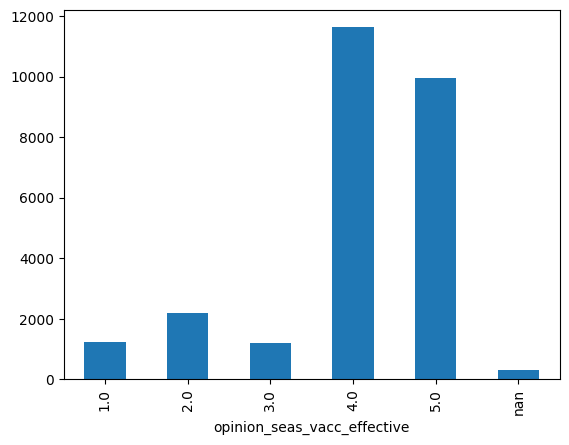

In [27]:
dataset.opinion_seas_vacc_effective.value_counts(dropna=False).sort_index().plot(kind="bar")

In [28]:
dataset[dataset.opinion_seas_vacc_effective==4]

,respondent_id,medicine_taken,reccomendation,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,Target
1,1,0.0,0.0,4.0,2.0,4.0,35 - 44 Years,1
2,2,0.0,0.0,4.0,1.0,2.0,18 - 34 Years,0
6,6,0.0,0.0,4.0,2.0,1.0,55 - 64 Years,0
7,7,0.0,0.0,4.0,2.0,1.0,45 - 54 Years,1
8,8,0.0,0.0,4.0,2.0,1.0,45 - 54 Years,0
9,9,0.0,0.0,4.0,2.0,2.0,55 - 64 Years,0
11,11,0.0,0.0,4.0,2.0,1.0,55 - 64 Years,1
13,13,0.0,0.0,4.0,2.0,4.0,35 - 44 Years,0
14,14,0.0,0.0,4.0,4.0,2.0,55 - 64 Years,0
16,16,0.0,1.0,4.0,4.0,1.0,65+ Years,1


In [29]:
dataset[dataset.opinion_seas_vacc_effective==4].opinion_seas_risk.value_counts()

opinion_seas_risk
2.0    4949
4.0    3259
1.0    2549
5.0     681
3.0     162
Name: count, dtype: int64

In [30]:
dataset[dataset.opinion_seas_vacc_effective==4].opinion_seas_sick_from_vacc.value_counts()

opinion_seas_sick_from_vacc
1.0    4657
2.0    4009
4.0    2365
5.0     541
3.0      12
Name: count, dtype: int64

In [31]:
dataset[dataset.opinion_seas_vacc_effective==5]

,respondent_id,medicine_taken,reccomendation,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,Target
3,3,0.0,1.0,5.0,4.0,1.0,65+ Years,1
5,5,0.0,1.0,5.0,4.0,4.0,65+ Years,0
10,10,0.0,0.0,5.0,4.0,4.0,45 - 54 Years,1
12,12,0.0,1.0,5.0,4.0,1.0,65+ Years,1
18,18,0.0,1.0,5.0,4.0,2.0,65+ Years,0
19,19,0.0,0.0,5.0,2.0,1.0,55 - 64 Years,0
26,26,0.0,1.0,5.0,5.0,4.0,45 - 54 Years,1
33,33,0.0,1.0,5.0,2.0,4.0,65+ Years,0
35,35,1.0,1.0,5.0,2.0,5.0,55 - 64 Years,1
39,39,0.0,0.0,5.0,4.0,2.0,65+ Years,1


In [32]:
dataset[dataset.opinion_seas_vacc_effective==5].opinion_seas_risk.value_counts()

opinion_seas_risk
4.0    3887
2.0    2497
5.0    2088
1.0    1267
3.0     207
Name: count, dtype: int64

In [33]:
dataset[dataset.opinion_seas_vacc_effective==5].opinion_seas_sick_from_vacc.value_counts()

opinion_seas_sick_from_vacc
1.0    5019
2.0    2402
4.0    1761
5.0     749
3.0      15
Name: count, dtype: int64

In [34]:
dataset.fillna({"opinion_seas_vacc_effective":4},inplace=True)

In [35]:
dataset.fillna({"opinion_seas_risk":dataset.opinion_seas_risk.mode()[0]},inplace=True)

In [36]:
dataset.fillna({"opinion_seas_sick_from_vacc":dataset.opinion_seas_sick_from_vacc.mode()[0]},inplace=True)

In [37]:
dataset.drop(columns="age_group",inplace=True)

In [38]:
dataset.isnull().sum()

respondent_id                  0
medicine_taken                 0
reccomendation                 0
opinion_seas_vacc_effective    0
opinion_seas_risk              0
opinion_seas_sick_from_vacc    0
Target                         0
dtype: int64

In [39]:
dataset.to_csv("seasonal.csv",index=False)